In [5]:
import Pkg; Pkg.add("DifferentialEquations")

   Resolving package versions...
  No Changes to `/opt/julia/environments/v1.9/Project.toml`
  No Changes to `/opt/julia/environments/v1.9/Manifest.toml`


In [6]:
import Pkg; Pkg.add("Plots")

   Resolving package versions...
  No Changes to `/opt/julia/environments/v1.9/Project.toml`
  No Changes to `/opt/julia/environments/v1.9/Manifest.toml`


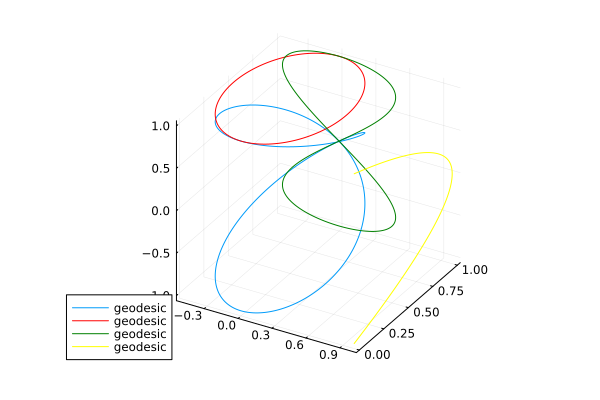

In [7]:
using DifferentialEquations
using LinearAlgebra

"""
クリストッフェル記号を計算する関数
入力:
- u, v: 点の座標
- g: 計量テンソル を返す関数 g(u,v) -> Matrix{Float64}
出力:
- Γ: クリストッフェル記号の配列 [Γᵢⱼᵏ]
"""
function christoffel_symbols(u::Float64, v::Float64, g)
    # 計量テンソルとその逆行列を計算
    gmat = g(u, v)
    ginv = inv(gmat)
    
    # 計量テンソルの偏導関数を数値的に計算
    ε = 1e-6
    ∂g_∂u = (g(u + ε, v) - g(u - ε, v)) / (2ε)
    ∂g_∂v = (g(u, v + ε) - g(u, v - ε)) / (2ε)
    
    # クリストッフェル記号を計算
    Γ = zeros(2, 2, 2)  # [i,j,k] where Γᵏᵢⱼ
    
    for k in 1:2
        for i in 1:2
            for j in 1:2
                sum = 0.0
                for m in 1:2
                    # ∂gᵢⱼ/∂xᵏ の項を選択
                    if k == 1
                        ∂g = ∂g_∂u[i,j]
                    else
                        ∂g = ∂g_∂v[i,j]
                    end
                    sum += 0.5 * ginv[m,k] * (∂g + 
                           (k == 1 ? ∂g_∂u[i,m] : ∂g_∂v[i,m]) - 
                           (k == 1 ? ∂g_∂u[m,j] : ∂g_∂v[m,j]))
                end
                Γ[i,j,k] = sum
            end
        end
    end
    return Γ
end

"""
測地線方程式の右辺を計算する関数
入力:
- dx: 現在の状態 [u, v, du/ds, dv/ds]
- params: パラメータ (計量テンソル関数)
- s: パラメータ
出力:
- ddx: 導関数 [du/ds, dv/ds, d²u/ds², d²v/ds²]
"""
function geodesic_equation!(ddx, dx, params, s)
    g = params
    u, v, du_ds, dv_ds = dx
    
    # クリストッフェル記号を計算
    Γ = christoffel_symbols(u, v, g)
    
    # 測地線方程式の右辺を計算
    d²u_ds² = -Γ[1,1,1]*du_ds^2 - 2Γ[1,1,2]*du_ds*dv_ds - Γ[1,2,2]*dv_ds^2
    d²v_ds² = -Γ[2,1,1]*du_ds^2 - 2Γ[2,1,2]*du_ds*dv_ds - Γ[2,2,2]*dv_ds^2
    
    ddx[1] = du_ds
    ddx[2] = dv_ds
    ddx[3] = d²u_ds²
    ddx[4] = d²v_ds²
end

"""
測地線を計算する関数
入力:
- u0, v0: 初期位置
- du0, dv0: 初期速度
- g: 計量テンソル関数
- s_span: パラメータの範囲 (tspan)
出力:
- sol: 解オブジェクト
"""
function solve_geodesic(u0, v0, du0, dv0, g, s_span)
    # 初期条件
    x0 = [u0, v0, du0, dv0]
    
    # ODEの問題を定義
    prob = ODEProblem(geodesic_equation!, x0, s_span, g)
    
    # 解を計算
    sol = solve(prob, Euler(), dt=0.01)
    
    return sol
end

# 使用例：球面上の測地線
# 球面の計量テンソル
function sphere_metric(u, v)
    return [1.0 0.0; 0.0 sin(u)^2]
end

# 初期条件と計算範囲
u0, v0 = pi/2, pi/2  # 初期位置
du0, dv0 = 0.01, 0.01  # 初期速度
s_span = (0.0, 1050.0)

# 測地線を計算
sol = solve_geodesic(u0, v0, du0, dv0, sphere_metric, s_span)

using Plots

# 解から座標を取り出す
u_sol = [x[1] for x in sol.u]
v_sol = [x[2] for x in sol.u]

x_sol = sin.(u_sol) .* cos.(v_sol)
y_sol = sin.(u_sol) .* sin.(v_sol)
z_sol = cos.(u_sol)
zero_a = zeros(length(z_sol)).+1
color_values = z_sol

# プロット
plot3d(x_sol, y_sol, z_sol, label="geodesic")
plot3d!(x_sol, y_sol, zero_a, label="geodesic", color=:red)
plot3d!(x_sol, zero_a, z_sol, label="geodesic", color=:green)
plot3d!(zero_a, y_sol, z_sol, label="geodesic", color=:yellow)


#plot(x_sol, y_sol, label="geodesic")

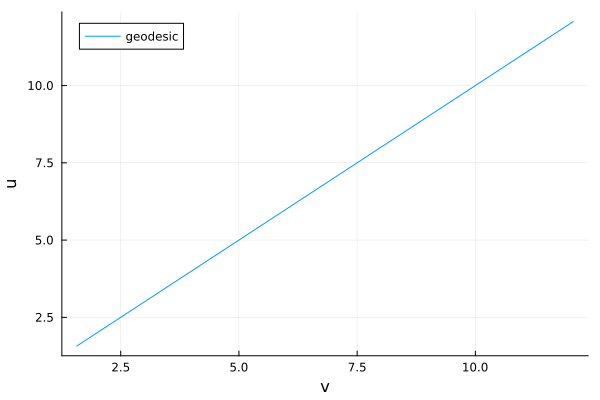

In [8]:
plot(v_sol, u_sol, label="geodesic", xlabel="v", ylabel="u")
